### Library Import

In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from scipy import stats
import charset_normalizer
from scipy import stats
# streamlit_bar_plot.py
import streamlit as st
import plotly.io as pio



### Load dataset

In [5]:
with open("visualizing_global_co2_data_cleaned.csv", 'rb') as data:
    result = charset_normalizer.detect(data.read(10000))
print(result)

{'encoding': 'ascii', 'language': 'English', 'confidence': 1.0}


In [6]:
dfp = pd.read_csv('visualizing_global_co2_data_cleaned.csv', encoding='ascii')
dfp.to_csv('ECO_DataFrame.csv',encoding='utf-8', index=False)
df = pd.read_csv('ECO_DataFrame.csv', encoding='utf-8')

In [7]:
df.head()

,country,year,iso_code,population,cement_co2,cement_co2_per_capita,co2,co2_growth_abs,co2_growth_prct,co2_including_luc,...,share_global_cumulative_oil_co2,share_global_flaring_co2,share_global_gas_co2,share_global_luc_co2,share_global_oil_co2,share_of_temperature_change_from_ghg,temperature_change_from_ch4,temperature_change_from_co2,temperature_change_from_ghg,temperature_change_from_n2o
0,Afghanistan,1949,AFG,7356890.0,0.0,0.0,0.015,NaN,NaN,8.039,...,0.000,NaN,0.0,0.160,0.000,0.129,0.0,0.0,0.000,0.0
1,Afghanistan,1950,AFG,7480464.0,0.0,0.0,0.084,0.070,475.000,8.585,...,0.000,0.0,0.0,0.157,0.004,0.129,0.0,0.0,0.000,0.0
2,Afghanistan,1951,AFG,7571542.0,0.0,0.0,0.092,0.007,8.696,9.142,...,0.000,0.0,0.0,0.162,0.004,0.129,0.0,0.0,0.001,0.0
3,Afghanistan,1952,AFG,7667534.0,0.0,0.0,0.092,0.000,0.000,9.948,...,0.001,0.0,0.0,0.172,0.003,0.129,0.0,0.0,0.001,0.0
4,Afghanistan,1953,AFG,7764549.0,0.0,0.0,0.106,0.015,16.000,10.915,...,0.001,0.0,0.0,0.185,0.003,0.129,0.0,0.0,0.001,0.0


### Inspect dataset

In [9]:
df.shape

(23494, 55)

In [10]:
column_names = df.columns.tolist()
print(column_names)

['country', 'year', 'iso_code', 'population', 'cement_co2', 'cement_co2_per_capita', 'co2', 'co2_growth_abs', 'co2_growth_prct', 'co2_including_luc', 'co2_including_luc_growth_abs', 'co2_including_luc_growth_prct', 'co2_including_luc_per_capita', 'co2_including_luc_per_gdp', 'co2_per_capita', 'co2_per_gdp', 'coal_co2', 'coal_co2_per_capita', 'cumulative_cement_co2', 'cumulative_co2', 'cumulative_co2_including_luc', 'cumulative_coal_co2', 'cumulative_flaring_co2', 'cumulative_gas_co2', 'cumulative_luc_co2', 'cumulative_oil_co2', 'flaring_co2', 'flaring_co2_per_capita', 'gas_co2', 'gas_co2_per_capita', 'land_use_change_co2', 'land_use_change_co2_per_capita', 'oil_co2', 'oil_co2_per_capita', 'share_global_cement_co2', 'share_global_co2', 'share_global_co2_including_luc', 'share_global_coal_co2', 'share_global_cumulative_cement_co2', 'share_global_cumulative_co2', 'share_global_cumulative_co2_including_luc', 'share_global_cumulative_coal_co2', 'share_global_cumulative_flaring_co2', 'share_

In [11]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23494 entries, 0 to 23493
Data columns (total 55 columns):
 #   Column                                     Non-Null Count  Dtype  
---  ------                                     --------------  -----  
 0   country                                    23494 non-null  object 
 1   year                                       23494 non-null  int64  
 2   iso_code                                   20708 non-null  object 
 3   population                                 22568 non-null  float64
 4   cement_co2                                 19992 non-null  float64
 5   cement_co2_per_capita                      19920 non-null  float64
 6   co2                                        23494 non-null  float64
 7   co2_growth_abs                             23225 non-null  float64
 8   co2_growth_prct                            23187 non-null  float64
 9   co2_including_luc                          22541 non-null  float64
 10  co2_including_luc_grow

In [12]:
print(df.describe())

               year    population    cement_co2  cement_co2_per_capita  \
count  23494.000000  2.256800e+04  19992.000000           19920.000000   
mean    1961.874479  9.286270e+07     10.483836               0.072929   
std       42.909937  4.185106e+08     70.268641               0.128854   
min     1850.000000  1.480000e+03      0.000000               0.000000   
25%     1935.000000  1.415456e+06      0.000000               0.000000   
50%     1970.000000  5.339778e+06      0.116000               0.016000   
75%     1997.000000  2.176019e+07      1.287000               0.104000   
max     2021.000000  7.909295e+09   1672.592000               2.574000   

                co2  co2_growth_abs  co2_growth_prct  co2_including_luc  \
count  23494.000000    23225.000000     23187.000000       22541.000000   
mean     348.082463        7.039834        21.443355         535.012927   
std     1755.343203       65.473380       725.386087        2152.859532   
min        0.000000    -1818.4720

In [13]:
df.isna().sum()

country                                         0
year                                            0
iso_code                                     2786
population                                    926
cement_co2                                   3502
cement_co2_per_capita                        3574
co2                                             0
co2_growth_abs                                269
co2_growth_prct                               307
co2_including_luc                             953
co2_including_luc_growth_abs                 1232
co2_including_luc_growth_prct                1166
co2_including_luc_per_capita                 1025
co2_including_luc_per_gdp                    7846
co2_per_capita                                 72
co2_per_gdp                                  7790
coal_co2                                       70
coal_co2_per_capita                           142
cumulative_cement_co2                        3502
cumulative_co2                                  0


In [14]:
(df.isna().mean() * 100).round()

country                                       0.0
year                                          0.0
iso_code                                     12.0
population                                    4.0
cement_co2                                   15.0
cement_co2_per_capita                        15.0
co2                                           0.0
co2_growth_abs                                1.0
co2_growth_prct                               1.0
co2_including_luc                             4.0
co2_including_luc_growth_abs                  5.0
co2_including_luc_growth_prct                 5.0
co2_including_luc_per_capita                  4.0
co2_including_luc_per_gdp                    33.0
co2_per_capita                                0.0
co2_per_gdp                                  33.0
coal_co2                                      0.0
coal_co2_per_capita                           1.0
cumulative_cement_co2                        15.0
cumulative_co2                                0.0


In [15]:
df.isna().sum().sum()

74255

## Data Cleaning

Dataste Preliminary Plan: 

Categorical (iso_code): Forward Fill or leave it (because iso_code is linked to country and doesn't change over years).

Numerical (like population, co2_including_luc_per_gdp, etc.):

If time-based (like population, co2), use forward fill (ffill) per country.

Otherwise, Interpolation or mean/median imputation.

### Remove duplicates

In [19]:
duplicates = df.duplicated()
print(f"Duplicated count: {duplicates.sum()}")

Duplicated count: 0


### Handle missing values

In [21]:
# Seleccionar columnas numéricas excepto 'population
numerical_columns = df.select_dtypes(include='number').columns.drop('population')

# Create a copy of the dataframe to avoid the index mismatch
df_processed = df.copy()

# Process each country group
for country in df['country'].unique():
    country_mask = df['country'] == country
    # Sort by year within each country group
    country_data = df[country_mask].sort_values('year')
    # Apply interpolation, forward fill and backward fill
    interpolated_data = country_data[numerical_columns].interpolate(method='linear').ffill().bfill()
    # Assign back to the original positions
    df_processed.loc[country_mask, numerical_columns] = interpolated_data

# Now df_processed contains the interpolated values
df = df_processed
print(df)

           country  year iso_code  population  cement_co2  \
0      Afghanistan  1949      AFG   7356890.0       0.000   
1      Afghanistan  1950      AFG   7480464.0       0.000   
2      Afghanistan  1951      AFG   7571542.0       0.000   
3      Afghanistan  1952      AFG   7667534.0       0.000   
4      Afghanistan  1953      AFG   7764549.0       0.000   
...            ...   ...      ...         ...         ...   
23489     Zimbabwe  2017      ZWE  14751101.0       0.469   
23490     Zimbabwe  2018      ZWE  15052191.0       0.558   
23491     Zimbabwe  2019      ZWE  15354606.0       0.570   
23492     Zimbabwe  2020      ZWE  15669663.0       0.570   
23493     Zimbabwe  2021      ZWE  15993525.0       0.570   

       cement_co2_per_capita     co2  co2_growth_abs  co2_growth_prct  \
0                      0.000   0.015           0.070          475.000   
1                      0.000   0.084           0.070          475.000   
2                      0.000   0.092           0

In [22]:
# Mostrar columnas numéricas que aún tienen valores nulos
missing_values = df[numerical_columns].isnull().sum()
missing_values[missing_values > 0]


co2_growth_abs                                  1
co2_growth_prct                                 1
co2_including_luc                             953
co2_including_luc_growth_abs                  954
co2_including_luc_growth_prct                 954
co2_including_luc_per_capita                  953
co2_including_luc_per_gdp                    3373
co2_per_gdp                                  3314
cumulative_co2_including_luc                  953
cumulative_luc_co2                            953
land_use_change_co2                           953
land_use_change_co2_per_capita                953
share_global_co2_including_luc                953
share_global_cumulative_co2_including_luc     953
share_global_cumulative_flaring_co2             1
share_global_cumulative_luc_co2               953
share_global_flaring_co2                        1
share_global_luc_co2                          953
share_of_temperature_change_from_ghg          320
temperature_change_from_ch4                  1173


In [23]:
df.isna().sum().sum()

25147

In [24]:
# Lista de columnas relevantes para el analisis
columnas_utiles = [
    'year', 'iso_code', 'country', 'co2', 'co2_growth_abs', 'co2_growth_prct', 'cumulative_co2',
    'co2_including_luc', 'cumulative_co2_including_luc', 'share_global_co2',
    'cement_co2', 'cement_co2_per_capita', 'coal_co2', 'coal_co2_per_capita',
    'gas_co2', 'gas_co2_per_capita', 'oil_co2', 'oil_co2_per_capita',
    'flaring_co2', 'flaring_co2_per_capita', 'land_use_change_co2','land_use_change_co2_per_capita',
    'share_global_cement_co2', 'share_global_coal_co2', 'share_global_oil_co2',
    'share_global_gas_co2', 'share_global_flaring_co2', 'share_global_luc_co2',
    'cumulative_coal_co2', 'cumulative_gas_co2', 'cumulative_oil_co2',
    'cumulative_flaring_co2', 'cumulative_luc_co2', 'share_of_temperature_change_from_ghg' ,'temperature_change_from_ch4',
    'temperature_change_from_co2',
    'temperature_change_from_ghg',
    'temperature_change_from_n2o',
    'co2_including_luc',
    'co2_including_luc_per_gdp',
    'share_global_co2_including_luc'
]
# Crear un nuevo DataFrame solo con las columnas necesarias
df = df[columnas_utiles]




In [25]:
# Selected coulumns
df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23494 entries, 0 to 23493
Data columns (total 41 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   year                                  23494 non-null  int64  
 1   iso_code                              20708 non-null  object 
 2   country                               23494 non-null  object 
 3   co2                                   23494 non-null  float64
 4   co2_growth_abs                        23493 non-null  float64
 5   co2_growth_prct                       23493 non-null  float64
 6   cumulative_co2                        23494 non-null  float64
 7   co2_including_luc                     22541 non-null  float64
 8   cumulative_co2_including_luc          22541 non-null  float64
 9   share_global_co2                      23494 non-null  float64
 10  cement_co2                            23494 non-null  float64
 11  cement_co2_per_

In [26]:
missing_values = df[columnas_utiles].isnull().sum()
missing_values[missing_values > 0]

iso_code                                2786
co2_growth_abs                             1
co2_growth_prct                            1
co2_including_luc                        953
co2_including_luc                        953
cumulative_co2_including_luc             953
land_use_change_co2                      953
land_use_change_co2_per_capita           953
share_global_flaring_co2                   1
share_global_luc_co2                     953
cumulative_luc_co2                       953
share_of_temperature_change_from_ghg     320
temperature_change_from_ch4             1173
temperature_change_from_co2              320
temperature_change_from_ghg              320
temperature_change_from_n2o             1173
co2_including_luc                        953
co2_including_luc                        953
co2_including_luc_per_gdp               3373
share_global_co2_including_luc           953
dtype: int64

In [27]:
# Comprobar cuantos quedan
df.isnull().sum().sum()


17092

In [28]:
# Rellenar todos los valores numéricos faltantes con cero
df = df.fillna({col: 0 for col in df.select_dtypes(include='number').columns})

In [29]:
# Comprobar que no quedan valores nulos
df.isnull().sum().sum()


2786

In [30]:
missing_values = df[columnas_utiles].isnull().sum()
missing_values[missing_values > 0]

iso_code    2786
dtype: int64

### Correct data types

In [32]:
df.dtypes

year                                      int64
iso_code                                 object
country                                  object
co2                                     float64
co2_growth_abs                          float64
co2_growth_prct                         float64
cumulative_co2                          float64
co2_including_luc                       float64
cumulative_co2_including_luc            float64
share_global_co2                        float64
cement_co2                              float64
cement_co2_per_capita                   float64
coal_co2                                float64
coal_co2_per_capita                     float64
gas_co2                                 float64
gas_co2_per_capita                      float64
oil_co2                                 float64
oil_co2_per_capita                      float64
flaring_co2                             float64
flaring_co2_per_capita                  float64
land_use_change_co2                     

In [33]:
df[['country', 'iso_code']] = df[['country','iso_code']].astype('category')

In [34]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23494 entries, 0 to 23493
Data columns (total 41 columns):
 #   Column                                Non-Null Count  Dtype   
---  ------                                --------------  -----   
 0   year                                  23494 non-null  int64   
 1   iso_code                              20708 non-null  category
 2   country                               23494 non-null  category
 3   co2                                   23494 non-null  float64 
 4   co2_growth_abs                        23494 non-null  float64 
 5   co2_growth_prct                       23494 non-null  float64 
 6   cumulative_co2                        23494 non-null  float64 
 7   co2_including_luc                     23494 non-null  float64 
 8   cumulative_co2_including_luc          23494 non-null  float64 
 9   share_global_co2                      23494 non-null  float64 
 10  cement_co2                            23494 non-null  float64 
 11  ce

In [35]:
# columna continete para agrupacion 
df = df.rename(columns={'country': 'territory'})

africa = [
    "Algeria", "Angola", "Benin", "Botswana", "Burkina Faso", "Burundi",
    "Cabo Verde (Cape Verde)", "Cameroon", "Central African Republic", "Chad",
    "Comoros", "Congo", "Democratic Republic of Congo", "Cote d'Ivoire", "Djibouti",
    "Egypt", "Equatorial Guinea", "Eritrea", "Eswatini", "Ethiopia", "Gabon",
    "Gambia", "Ghana", "Guinea", "Guinea-Bissau", "Kenya", "Lesotho", "Liberia",
    "Libya", "Madagascar", "Malawi", "Mali", "Mauritania", "Mauritius", "Mayotte",
    "Morocco", "Mozambique", "Namibia", "Niger", "Nigeria", "Reunion", "Rwanda",
    "Sao Tome and Principe", "Senegal", "Seychelles", "Sierra Leone", "Somalia",
    "South Africa", "South Sudan", "Sudan", "Tanzania", "Togo", "Tunisia",
    "Uganda", "Zambia", "Zimbabwe"
]
asia = [
    "Afghanistan", "Armenia", "Azerbaijan", "Bahrain", "Bangladesh", "Bhutan",
    "Brunei", "Cambodia", "China", "Georgia", "India", "Indonesia", "Iran",
    "Iraq", "Israel", "Japan", "Jordan", "Kazakhstan", "Kuwait", "Kyrgyzstan",
    "Laos", "Lebanon", "Malaysia", "Maldives", "Mongolia", "Myanmar", "Nepal",
    "North Korea", "Oman", "Pakistan", "Palestine", "Philippines", "Qatar",
    "Saudi Arabia", "Singapore", "South Korea", "Sri Lanka", "Syria", "Taiwan",
    "Tajikistan", "Thailand", "Timor-Leste (East Timor)", "Turkey", "Turkmenistan",
    "United Arab Emirates", "Uzbekistan", "Vietnam", "Yemen"
]

europa = [
    "Albania", "Andorra", "Austria", "Belarus", "Belgium", "Bosnia and Herzegovina",
    "Bulgaria", "Croatia", "Cyprus", "Czechia", "Denmark", "Estonia", "Finland",
    "France", "Germany", "Greece", "Hungary", "Iceland", "Ireland", "Italy",
    "Kosovo", "Latvia", "Liechtenstein", "Lithuania", "Luxembourg", "Malta",
    "Moldova", "Monaco", "Montenegro", "Netherlands", "North Macedonia", "Norway",
    "Poland", "Portugal",# Method 1: Reindex columns

]

america = [
    "Antigua and Barbuda", "Bahamas", "Barbados", "Belize", "Canada", "Costa Rica",
    "Cuba", "Dominica", "Dominican Republic", "El Salvador", "Grenada", "Guadeloupe",
    "Guatemala", "Haiti", "Honduras", "Jamaica", "Martinique", "Mexico", "Nicaragua",
    "Panama", "Puerto Rico", "Saint Kitts and Nevis", "Saint Lucia",
    "Saint Pierre and Miquelon", "Saint Vincent and the Grenadines",
    "Trinidad and Tobago", "United States", "Argentina", "Bolivia", "Brazil",
    "Chile", "Colombia", "Ecuador", "French Guiana", "Guyana", "Paraguay", "Peru",
    "Suriname", "Uruguay", "Venezuela"
]

oceania = [
    "Australia", "Fiji", "Kiribati", "Marshall Islands", "Micronesia", "Nauru",
    "New Zealand", "Palau", "Papua New Guinea", "Samoa", "Solomon Islands", "Tonga",
    "Tuvalu", "Vanuatu", "Wallis and Futuna", "Cook Islands", "New Caledonia", "Niue"
]

# Create a function to determine the continent for each country
def get_continent(territory):
    if territory in africa:
        return 'Africa'
    elif territory in asia:
        return 'Asia'
    elif territory in europa:
        return 'Europe'
    elif territory in america:
        return 'America'
    elif territory in oceania:
        return 'Oceania'
    else:
        return 'Unknown'

# Apply the function to create the continent column
# Assuming your country column is named 'country'
df['continent'] = df['territory'].apply(get_continent)

display(df)

,year,iso_code,territory,co2,co2_growth_abs,co2_growth_prct,cumulative_co2,co2_including_luc,cumulative_co2_including_luc,share_global_co2,...,cumulative_luc_co2,share_of_temperature_change_from_ghg,temperature_change_from_ch4,temperature_change_from_co2,temperature_change_from_ghg,temperature_change_from_n2o,co2_including_luc,co2_including_luc_per_gdp,share_global_co2_including_luc,continent
0,1949,AFG,Afghanistan,0.015,0.070,475.000,0.015,8.039,8.039,0.000,...,527.616,0.129,0.000,0.000,0.000,0.0,8.039,0.911,0.078,Asia
1,1950,AFG,Afghanistan,0.084,0.070,475.000,0.099,8.585,16.624,0.001,...,536.116,0.129,0.000,0.000,0.000,0.0,8.585,0.911,0.075,Asia
2,1951,AFG,Afghanistan,0.092,0.007,8.696,0.191,9.142,25.765,0.001,...,545.167,0.129,0.000,0.000,0.001,0.0,9.142,0.943,0.076,Asia
3,1952,AFG,Afghanistan,0.092,0.000,0.000,0.282,9.948,35.713,0.001,...,555.023,0.129,0.000,0.000,0.001,0.0,9.948,0.993,0.082,Asia
4,1953,AFG,Afghanistan,0.106,0.015,16.000,0.388,10.915,46.628,0.002,...,565.832,0.129,0.000,0.000,0.001,0.0,10.915,1.027,0.087,Asia
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23489,2017,ZWE,Zimbabwe,9.596,-0.937,-8.899,753.403,19.086,2974.117,0.027,...,2281.390,0.114,0.001,0.001,0.002,0.0,19.086,0.870,0.047,Africa
23490,2018,ZWE,Zimbabwe,11.795,2.199,22.920,765.199,20.626,2994.742,0.032,...,2290.220,0.114,0.001,0.001,0.002,0.0,20.626,0.908,0.050,Africa
23491,2019,ZWE,Zimbabwe,11.115,-0.681,-5.772,776.313,19.432,3014.175,0.030,...,2298.537,0.113,0.001,0.001,0.002,0.0,19.432,0.908,0.047,Africa
23492,2020,ZWE,Zimbabwe,10.608,-0.507,-4.559,786.921,18.485,3032.660,0.030,...,2306.415,0.112,0.001,0.001,0.002,0.0,18.485,0.908,0.047,Africa


In [36]:
# Method 1: Reindex columns
# Get all column names
cols = df.columns.tolist()
# Remove 'continent' from its current position
cols.remove('continent')
# Insert 'continent' at position 1 (second column)
cols.insert(3, 'continent')
# Reindex the DataFrame with the new column order
df = df[cols]
display(df)

,year,iso_code,territory,continent,co2,co2_growth_abs,co2_growth_prct,cumulative_co2,co2_including_luc,co2_including_luc,...,cumulative_luc_co2,share_of_temperature_change_from_ghg,temperature_change_from_ch4,temperature_change_from_co2,temperature_change_from_ghg,temperature_change_from_n2o,co2_including_luc,co2_including_luc,co2_including_luc_per_gdp,share_global_co2_including_luc
0,1949,AFG,Afghanistan,Asia,0.015,0.070,475.000,0.015,8.039,8.039,...,527.616,0.129,0.000,0.000,0.000,0.0,8.039,8.039,0.911,0.078
1,1950,AFG,Afghanistan,Asia,0.084,0.070,475.000,0.099,8.585,8.585,...,536.116,0.129,0.000,0.000,0.000,0.0,8.585,8.585,0.911,0.075
2,1951,AFG,Afghanistan,Asia,0.092,0.007,8.696,0.191,9.142,9.142,...,545.167,0.129,0.000,0.000,0.001,0.0,9.142,9.142,0.943,0.076
3,1952,AFG,Afghanistan,Asia,0.092,0.000,0.000,0.282,9.948,9.948,...,555.023,0.129,0.000,0.000,0.001,0.0,9.948,9.948,0.993,0.082
4,1953,AFG,Afghanistan,Asia,0.106,0.015,16.000,0.388,10.915,10.915,...,565.832,0.129,0.000,0.000,0.001,0.0,10.915,10.915,1.027,0.087
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23489,2017,ZWE,Zimbabwe,Africa,9.596,-0.937,-8.899,753.403,19.086,19.086,...,2281.390,0.114,0.001,0.001,0.002,0.0,19.086,19.086,0.870,0.047
23490,2018,ZWE,Zimbabwe,Africa,11.795,2.199,22.920,765.199,20.626,20.626,...,2290.220,0.114,0.001,0.001,0.002,0.0,20.626,20.626,0.908,0.050
23491,2019,ZWE,Zimbabwe,Africa,11.115,-0.681,-5.772,776.313,19.432,19.432,...,2298.537,0.113,0.001,0.001,0.002,0.0,19.432,19.432,0.908,0.047
23492,2020,ZWE,Zimbabwe,Africa,10.608,-0.507,-4.559,786.921,18.485,18.485,...,2306.415,0.112,0.001,0.001,0.002,0.0,18.485,18.485,0.908,0.047


In [37]:
territories_to_remove = [
    "Anguilla", "Aruba", "Bermuda", "Bonaire Sint Eustatius and Saba", 
    "British Virgin Islands", "Curacao", "Faroe Islands", "French Polynesia", 
    "Greenland", "Macao", "Montserrat", "Sint Maarten (Dutch part)", 
    "Turks and Caicos Islands", "Saint Helena"
]

# Assuming your DataFrame has a column named 'territory' or 'country'
df = df[~df['territory'].isin(territories_to_remove)]


In [38]:
# Crear la columna 'decade' a partir del año

df['decade'] = (df['year'] // 10) * 10

In [39]:
# Method 1: Reindex columns
# Get all column names
cols = df.columns.tolist()
# Remove 'continent' from its current position
cols.remove('decade')
# Insert 'continent' at position 1 (second column)
cols.insert(1, 'decade')
# Reindex the DataFrame with the new column order
df = df[cols]
display(df)

,year,decade,iso_code,territory,continent,co2,co2_growth_abs,co2_growth_prct,cumulative_co2,co2_including_luc,...,co2_including_luc,co2_including_luc,co2_including_luc,co2_including_luc,co2_including_luc,co2_including_luc,co2_including_luc,co2_including_luc,co2_including_luc_per_gdp,share_global_co2_including_luc
0,1949,1940,AFG,Afghanistan,Asia,0.015,0.070,475.000,0.015,8.039,...,8.039,8.039,8.039,8.039,8.039,8.039,8.039,8.039,0.911,0.078
1,1950,1950,AFG,Afghanistan,Asia,0.084,0.070,475.000,0.099,8.585,...,8.585,8.585,8.585,8.585,8.585,8.585,8.585,8.585,0.911,0.075
2,1951,1950,AFG,Afghanistan,Asia,0.092,0.007,8.696,0.191,9.142,...,9.142,9.142,9.142,9.142,9.142,9.142,9.142,9.142,0.943,0.076
3,1952,1950,AFG,Afghanistan,Asia,0.092,0.000,0.000,0.282,9.948,...,9.948,9.948,9.948,9.948,9.948,9.948,9.948,9.948,0.993,0.082
4,1953,1950,AFG,Afghanistan,Asia,0.106,0.015,16.000,0.388,10.915,...,10.915,10.915,10.915,10.915,10.915,10.915,10.915,10.915,1.027,0.087
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23489,2017,2010,ZWE,Zimbabwe,Africa,9.596,-0.937,-8.899,753.403,19.086,...,19.086,19.086,19.086,19.086,19.086,19.086,19.086,19.086,0.870,0.047
23490,2018,2010,ZWE,Zimbabwe,Africa,11.795,2.199,22.920,765.199,20.626,...,20.626,20.626,20.626,20.626,20.626,20.626,20.626,20.626,0.908,0.050
23491,2019,2010,ZWE,Zimbabwe,Africa,11.115,-0.681,-5.772,776.313,19.432,...,19.432,19.432,19.432,19.432,19.432,19.432,19.432,19.432,0.908,0.047
23492,2020,2020,ZWE,Zimbabwe,Africa,10.608,-0.507,-4.559,786.921,18.485,...,18.485,18.485,18.485,18.485,18.485,18.485,18.485,18.485,0.908,0.047


In [40]:
df.to_csv('dataset_visualizacion_co2.csv', index=False)


## Data Visualization

In [42]:
df = pd.read_csv('dataset_visualizacion_co2.csv')

How has the global trend of CO₂ emissions evolved, and which periods have shown significant changes in this trajectory?

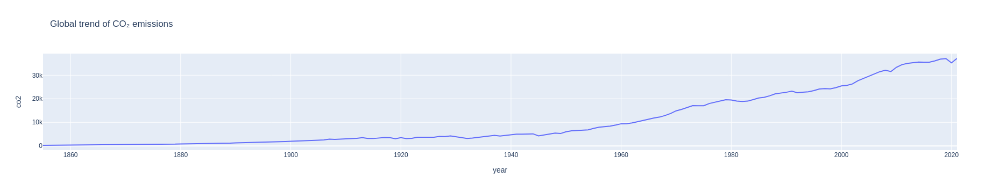

In [44]:
# CO2 Global trend
df_world = df.loc[df['territory'] == 'World']
color_sequence = px.colors.qualitative.Plotly
fig = px.line(df_world, 
              x="year", 
              y="co2", 
              color_discrete_sequence=color_sequence, 
              title='Global trend of CO₂ emissions')
fig.update_layout(template='plotly')
fig.show()

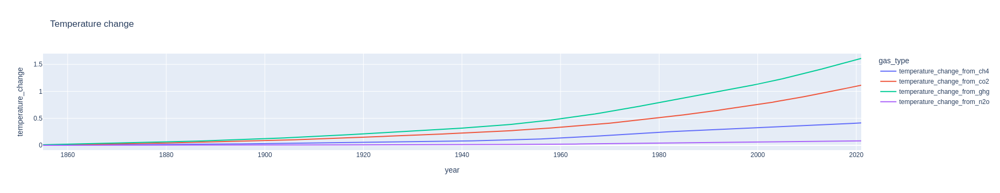

In [45]:
df_world_temp = df_world[['year', 
                          'temperature_change_from_ch4',
                          'temperature_change_from_co2',
                          'temperature_change_from_ghg',
                          'temperature_change_from_n2o']]

# Convertir a formato largo
df_temp_melted = df_world_temp.melt(
    id_vars=['year'],
    value_vars=['temperature_change_from_ch4',
                'temperature_change_from_co2',
                'temperature_change_from_ghg',
                'temperature_change_from_n2o'],
    var_name='gas_type',
    value_name='temperature_change'
)

# Crear gráfico de líneas
fig = px.line(df_temp_melted, 
              x="year", 
              y="temperature_change", 
              color='gas_type',
              color_discrete_sequence=color_sequence,
              title='Temperature change')

fig.update_layout(template='plotly')
fig.show()

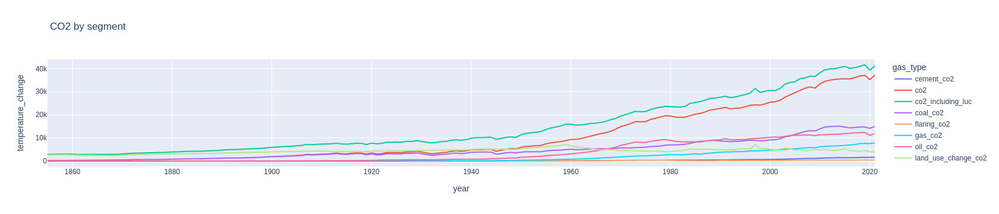

In [103]:
df_world = df.loc[df['territory'] == 'World']
df_world_co2 = df_world[['year', 'cement_co2', 'co2', 'co2_including_luc', 
                         'coal_co2', 'flaring_co2', 
                         'gas_co2', 'oil_co2', 'land_use_change_co2']]


# Convertir a formato largo
df_co2_melted = df_world_co2.melt(
    id_vars=['year'],
    value_vars=['cement_co2', 'co2', 'co2_including_luc', 'coal_co2', 'flaring_co2', 'gas_co2', 'oil_co2', 'co2_including_luc', 'land_use_change_co2'],
    var_name='gas_type',
    value_name='temperature_change'
)

# Crear gráfico de líneas
fig = px.line(df_co2_melted, 
              x="year", 
              y="temperature_change", 
              color='gas_type',
              color_discrete_sequence=color_sequence,
              title='CO2 by segment')
fig.update_layout(template='plotly')
fig.show()

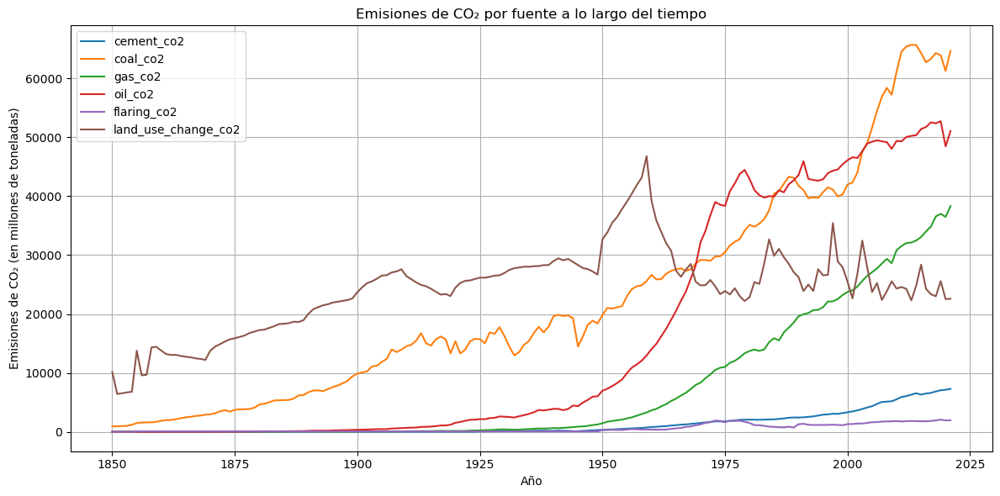

In [47]:
# grafico de linea para evaluar las emisiones de co2 por segmento (version Matplotlib)

df_2 = df[~df['continent'].isin(['Unknown'])]  # Changed 'Unknown' to ['Unknown'] to make it a list


# Paso 3: Filtrar las columnas que nos interesan
columnas = [
    'year', 'cement_co2', 'coal_co2', 'gas_co2',
    'oil_co2', 'flaring_co2', 'land_use_change_co2'
]
df_2 = df[columnas]

# Paso 4: Agrupar por año (por si hay múltiples países o regiones)
df_agrupado = df_2.groupby('year').sum().reset_index()

# Paso 5: Graficar cada fuente de CO2 como una línea
plt.figure(figsize=(12, 6))
for columna in columnas[1:]:  # omitimos 'year'
    plt.plot(df_agrupado['year'], df_agrupado[columna], label=columna)

# Paso 6: Personalizar el gráfico
plt.title('Emisiones de CO₂ por fuente a lo largo del tiempo')
plt.xlabel('Año')
plt.ylabel('Emisiones de CO₂ (en millones de toneladas)')
plt.legend()
plt.grid(True)
plt.tight_layout()



# Paso 7: Mostrar el gráfico
plt.show()


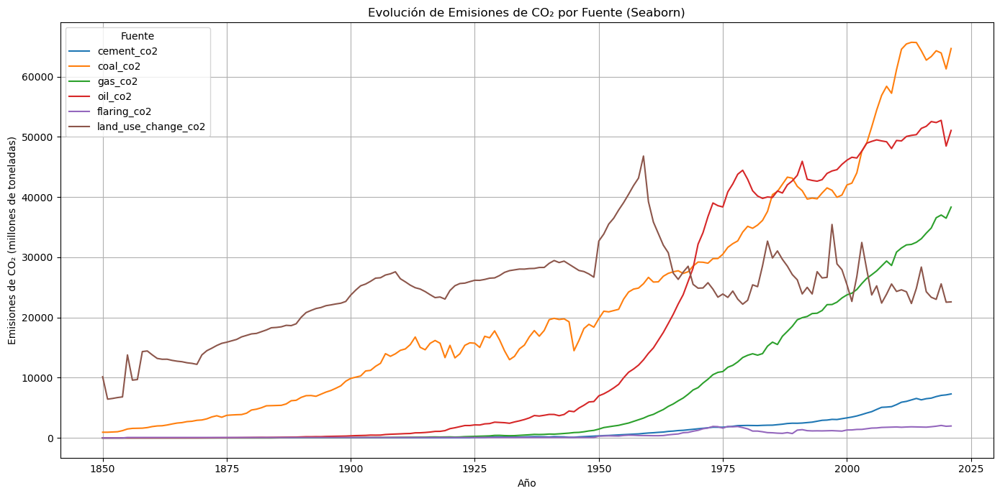

In [48]:
# grafico de linea para evaluar las emisiones de co2 por segmento (version Seaborn)

# Filtrar columnas relevantes
columnas = [
    'year', 'cement_co2', 'coal_co2', 'gas_co2',
    'oil_co2', 'flaring_co2', 'land_use_change_co2'
]
df_2 = df[columnas]

# Agrupar por año para sumar todas las emisiones (en caso de múltiples países)
df_agrupado = df_2.groupby('year').sum().reset_index()

# Paso 3: Transformar a formato largo (melt)
df_melt = df_agrupado.melt(id_vars='year', 
                           var_name='Fuente_CO2', 
                           value_name='Emisiones_CO2')

# Paso 4: Graficar con Seaborn
plt.figure(figsize=(14, 7))
sns.lineplot(data=df_melt, x='year', y='Emisiones_CO2', hue='Fuente_CO2')

plt.title('Evolución de Emisiones de CO₂ por Fuente (Seaborn)')
plt.xlabel('Año')
plt.ylabel('Emisiones de CO₂ (millones de toneladas)')
plt.legend(title='Fuente')
plt.grid(True)
plt.tight_layout()
plt.show()


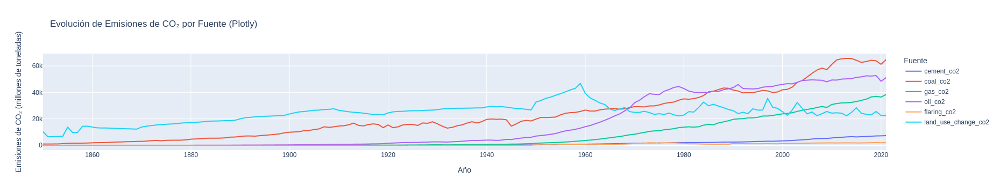

In [49]:

# Paso 3: Transformar a formato largo (melt)
df_melt = df_agrupado.melt(id_vars='year', 
                           var_name='Fuente_CO2', 
                           value_name='Emisiones_CO2')

# Usamos el mismo df_melt generado anteriormente
fig = px.line(
    df_melt, 
    x='year', 
    y='Emisiones_CO2', 
    color='Fuente_CO2',
     color_discrete_sequence=color_sequence,
    title='Evolución de Emisiones de CO₂ por Fuente (Plotly)',
    labels={
        'year': 'Año',
        'Emisiones_CO2': 'Emisiones de CO₂ (millones de toneladas)',
        'Fuente_CO2': 'Fuente'
    }
)

fig.update_layout(template='plotly')
fig.show()


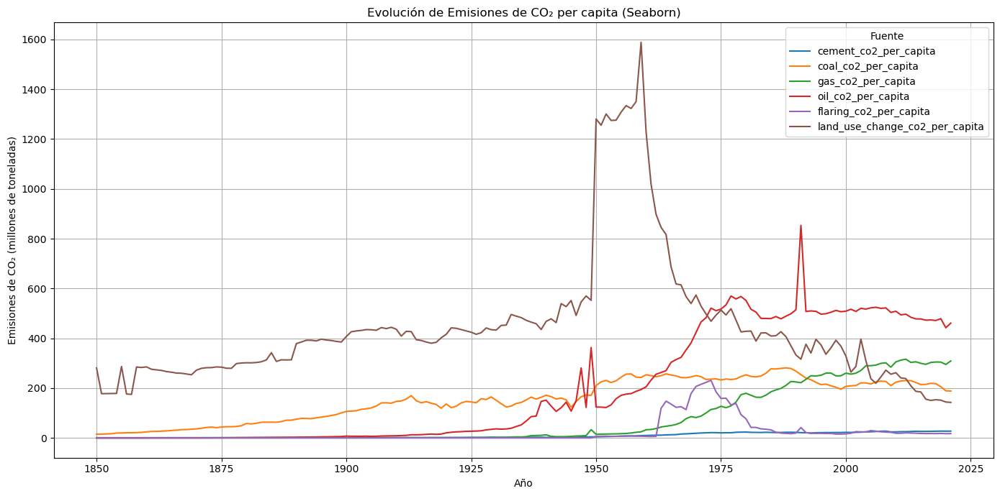

In [50]:
# grafico de linea para evaluar las emisiones de co2 por segmento (version Seaborn)

df = pd.read_csv('dataset_visualizacion_co2.csv')
# Filtrar columnas relevantes
columnas = [
    'year',
    'cement_co2_per_capita',  # Fixed: removed space and comma
    'coal_co2_per_capita',    # Fixed: separated into its own string
    'gas_co2_per_capita',     # Fixed: removed comma
    'oil_co2_per_capita',     # Fixed: separated into its own string
    'flaring_co2_per_capita',
    'land_use_change_co2_per_capita',
]
df = df[columnas]

# Agrupar por año para sumar todas las emisiones (en caso de múltiples países)
df_agrupado = df.groupby('year').sum().reset_index()

# Paso 3: Transformar a formato largo (melt)
df_melt = df_agrupado.melt(id_vars='year', 
                           var_name='Fuente_CO2', 
                           value_name='Emisiones_CO2')

# Paso 4: Graficar con Seaborn
plt.figure(figsize=(14, 7))
sns.lineplot(data=df_melt, x='year', y='Emisiones_CO2', hue='Fuente_CO2')

plt.title('Evolución de Emisiones de CO₂ per capita (Seaborn)')
plt.xlabel('Año')
plt.ylabel('Emisiones de CO₂ (millones de toneladas)')
plt.legend(title='Fuente')
plt.grid(True)
plt.tight_layout()
plt.show()

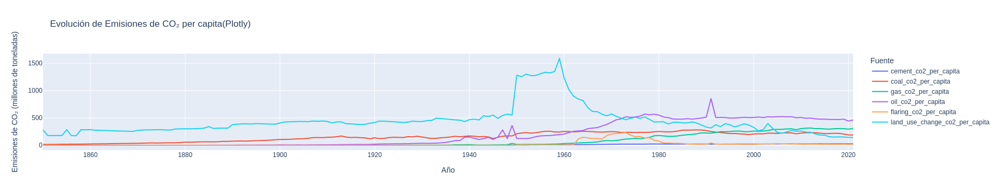

In [51]:

# Usamos el mismo df_melt generado anteriormente
fig = px.line(
    df_melt, 
    x='year', 
    y='Emisiones_CO2', 
    color='Fuente_CO2',
    color_discrete_sequence=color_sequence,
    title='Evolución de Emisiones de CO₂ per capita(Plotly)',
    labels={
        'year': 'Año',
        'Emisiones_CO2': 'Emisiones de CO₂ (millones de toneladas)',
        'Fuente_CO2': 'Fuente'
    }
)

fig.update_layout(template='plotly')
fig.show()


Breve descripción del comportamiento de las variables:

cement_co2: Emisiones por producción de cemento. Suelen crecer a medida que se industrializan los países.

coal_co2: Emisiones por uso de carbón. Alta en las primeras etapas de industrialización; puede caer con políticas ambientales.

gas_co2: Emisiones por gas natural. Aumentan en las últimas décadas como sustituto del carbón.

oil_co2: Emisiones por petróleo. Siguen un crecimiento sostenido por el uso en transporte y energía.

flaring_co2: Emisiones por quema de gas en pozos de petróleo. Comportamiento más irregular, depende de la industria energética.

land_use_change_co2: Emisiones por cambio de uso de suelo (deforestación, agricultura). Fluctúa según las políticas ambientales y expansión agrícola.

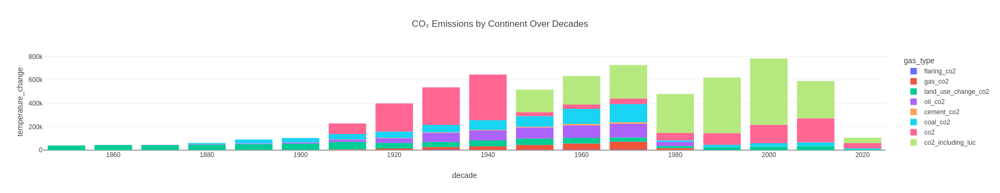

In [53]:
#data_df = df.loc[df['continent'] != 'Unknown'].groupby(["decade", "continent"], as_index=False)["co2"].sum()
df_co2_melted['decade'] = (df['year'] // 10) * 10
# Graficar
data_df = df_co2_melted.groupby(["decade", "gas_type"], as_index=False)["temperature_change"].sum()
fig = px.bar(data_df, 
             x="decade", 
             y="temperature_change", 
             color="gas_type",
             color_discrete_sequence=color_sequence,
             title="CO₂ Emissions by Continent Over Decades")
fig.show()

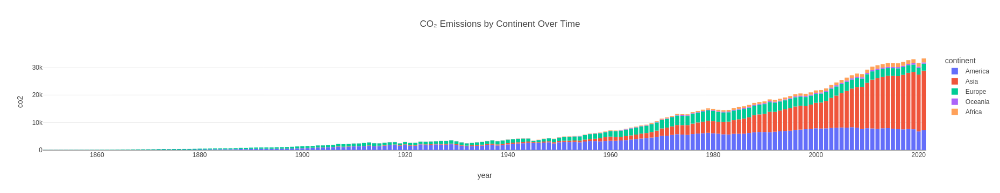

In [71]:
df = pd.read_csv('dataset_visualizacion_co2.csv')
data_df = df.loc[df['continent'] != 'Unknown'].groupby(["year", "continent"], as_index=False)["co2"].sum()

fig = px.bar(data_df, 
             x="year", 
             y="co2", 
             color="continent", 
             color_discrete_sequence=color_sequence,
             title="CO₂ Emissions by Continent Over Time")
fig.show()

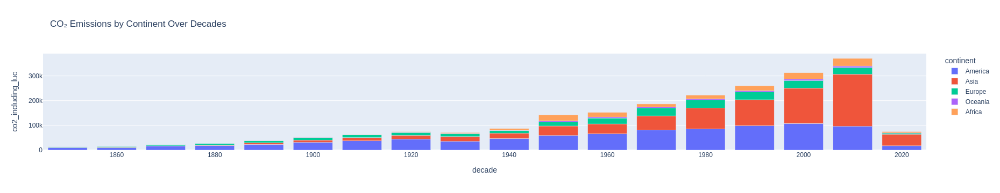

In [73]:
# CO₂ Emissions by Continent Over Decades
df_continent = df.loc[df['continent'] != 'Unknown'].groupby(["decade", "continent"], as_index=False)["co2_including_luc"].sum()

fig = px.bar(df_continent, 
             x="decade", 
             y="co2_including_luc", 
             color="continent", 
             color_discrete_sequence=color_sequence,
             title="CO₂ Emissions by Continent Over Decades")
fig.update_layout(template='plotly')
fig.show()

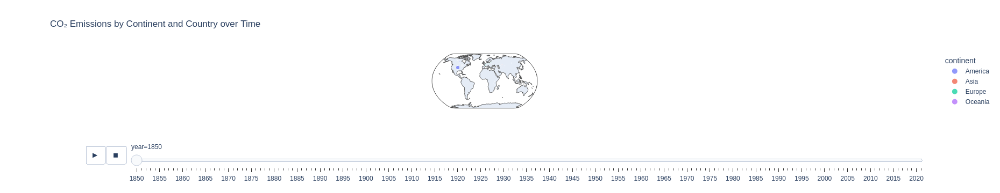

In [75]:
# CO₂ Emissions by Continent and Country over Time
df_map = df.loc[df['continent'] != 'Unknown'].groupby(["year", "continent", "iso_code", "territory"], as_index=False)["co2_including_luc"].sum()

fig = px.scatter_geo(df_map, 
                     locations="iso_code", 
                     color="continent",
                     color_discrete_sequence=color_sequence,
                     hover_name="territory",
                     size=(df_map["co2_including_luc"].abs())*2,
                     animation_frame="year",
                     projection="natural earth",
                     title="CO₂ Emissions by Continent and Country over Time")
fig.update_layout(template='plotly')
fig.show()

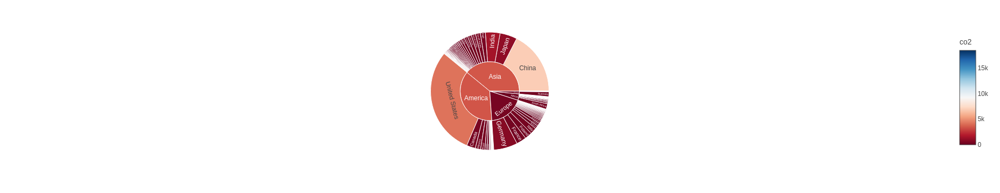

In [77]:
df_map_2 = df.loc[df['continent'] != 'Unknown'].groupby(["year", "continent", "iso_code", "territory"], as_index=False)["co2"].sum()
fig = px.sunburst(df_map_2, path=['continent', 'territory'], values='co2',
                  color='co2', hover_data=['iso_code'],
                  color_continuous_scale='RdBu',
                  color_continuous_midpoint=np.average(df['co2'], weights=df['co2']))
fig.show()

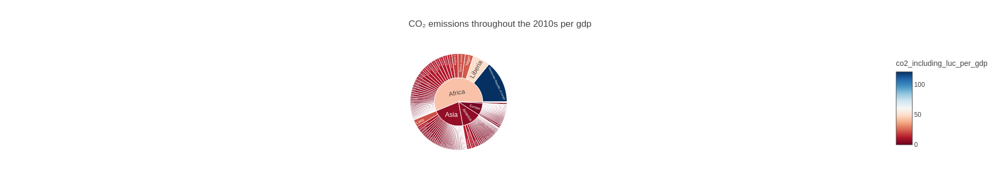

In [79]:
# Check if there are any non-zero values in the dataset
df_countries_gdp = df[(df['continent'] != 'Unknown') & (df['decade'] == 2010)] \
    .groupby(["continent", "iso_code", "territory"], as_index=False)["co2_including_luc_per_gdp"].sum()

# Use absolute values for the sunburst chart to avoid zero-sum issues
# Also, add a small epsilon to ensure no zero values
fig = px.sunburst(df_countries_gdp, 
                  path=['continent', 'territory'], 
                  values=(df_countries_gdp["co2_including_luc_per_gdp"].abs() + 1e-10),  # Add small value to avoid zeros
                  color='co2_including_luc_per_gdp', 
                  hover_data=['iso_code'],
                  color_continuous_scale='RdBu',
                  title="CO₂ emissions throughout the 2010s per gdp")

# Alternative approach: filter out zero values if appropriate for your analysis
# df_countries_gdp = df_countries_gdp[df_countries_gdp["co2_including_luc_per_gdp"] != 0]

fig.show()

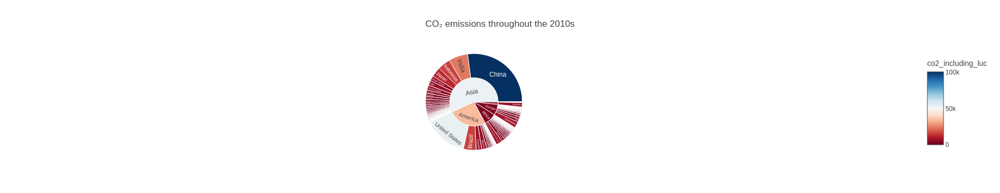

In [81]:
df_countries = df[(df['continent'] != 'Unknown') & (df['decade'] == 2010)] \
    .groupby(["continent", "iso_code", "territory"], as_index=False)["co2_including_luc"].sum()

df_countries = df_countries[df_countries["co2_including_luc"] > 0]

fig = px.sunburst(df_countries, path=['continent', 'territory'], values=df_countries["co2_including_luc"].abs(),
                  color='co2_including_luc', hover_data=['iso_code'],
                  color_continuous_scale='RdBu',
                  title="CO₂ emissions throughout the 2010s")
fig.show()

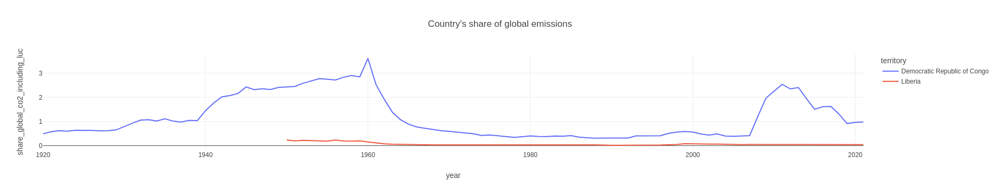

In [85]:
df_share_global_COD_LBR = df.loc[(df['territory'] == 'Democratic Republic of Congo') | (df['territory'] == 'Liberia')][['year', 'territory', 'share_global_co2_including_luc']]

fig = px.line(df_share_global_COD_LBR, 
              x="year", 
              y="share_global_co2_including_luc", 
              color='territory',
              color_discrete_sequence=color_sequence,
              title="Country's share of global emissions")
fig.show()

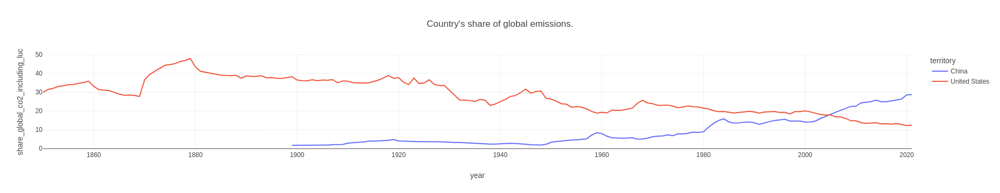

In [87]:
df_share_global_CHN_USA = df.loc[(df['territory'] == 'China') | (df['territory'] == 'United States')][['year', 'territory', 'share_global_co2_including_luc']]

fig = px.line(df_share_global_CHN_USA, 
              x="year", 
              y="share_global_co2_including_luc", 
              color='territory',
              color_discrete_sequence=color_sequence,
              title="Country's share of global emissions.")
fig.show()

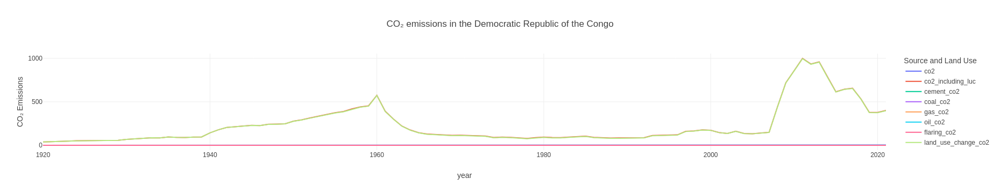

In [89]:
df_co2_COD = df.loc[df['territory'] == 'Democratic Republic of Congo'][['year', 'cement_co2', 'co2', 'co2_including_luc', 
                                                                         'coal_co2', 'flaring_co2', 
                                                                         'gas_co2', 'oil_co2', 'land_use_change_co2']]

df_melted_co2_COD = df_co2_COD.melt(id_vars=['year'],
                                value_vars=['co2', 'co2_including_luc', 'cement_co2', 'coal_co2', 'gas_co2', 'oil_co2', 'flaring_co2', 'land_use_change_co2'],
                                var_name='Source and Land Use',
                                value_name='CO₂ Emissions')

fig = px.line(df_melted_co2_COD, 
              x="year", 
              y="CO₂ Emissions", 
              color='Source and Land Use',
              color_discrete_sequence=color_sequence,
              title='CO₂ emissions in the Democratic Republic of the Congo')
fig.show()

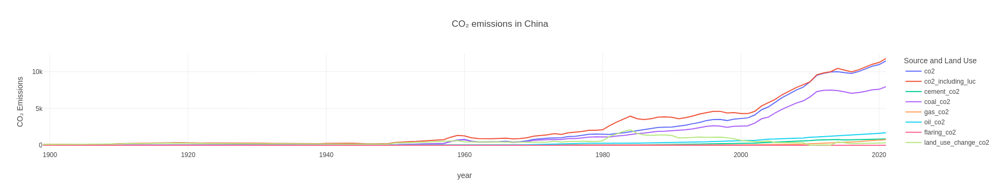

In [91]:
df_co2_CHN = df.loc[df['territory'] == 'China'][['year', 'cement_co2', 'co2', 'co2_including_luc', 
                                                 'coal_co2', 'flaring_co2', 
                                                 'gas_co2', 'oil_co2', 'land_use_change_co2']]

df_melted_co2_CHN = df_co2_CHN.melt(id_vars=['year'],
                                      value_vars=['co2', 'co2_including_luc', 'cement_co2', 'coal_co2', 'gas_co2', 'oil_co2', 'flaring_co2', 'land_use_change_co2'],
                                      var_name='Source and Land Use',
                                      value_name='CO₂ Emissions')

fig = px.line(df_melted_co2_CHN, 
              x="year", 
              y="CO₂ Emissions", 
              color='Source and Land Use',
              color_discrete_sequence=color_sequence,
              title='CO₂ emissions in China')
fig.show()

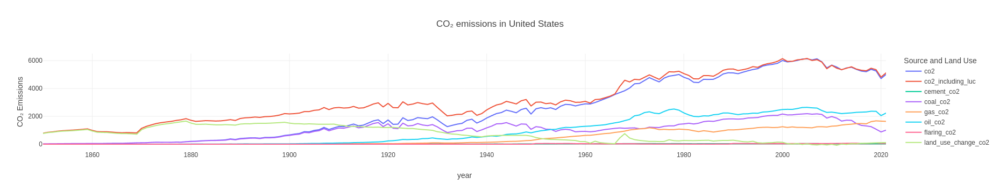

In [93]:
df_co2_USA = df.loc[df['territory'] == 'United States'][['year', 'cement_co2', 'co2', 'co2_including_luc', 
                                                         'coal_co2', 'flaring_co2', 
                                                         'gas_co2', 'oil_co2', 'land_use_change_co2']]

df_melted_co2_USA = df_co2_USA.melt(id_vars=['year'],
                                      value_vars=['co2', 'co2_including_luc', 'cement_co2', 'coal_co2', 'gas_co2', 'oil_co2', 'flaring_co2', 'land_use_change_co2'],
                                      var_name='Source and Land Use',
                                      value_name='CO₂ Emissions')

fig = px.line(df_melted_co2_USA, 
              x="year", 
              y="CO₂ Emissions", 
              color='Source and Land Use',
              color_discrete_sequence=color_sequence,
              title='CO₂ emissions in United States')
fig.show()

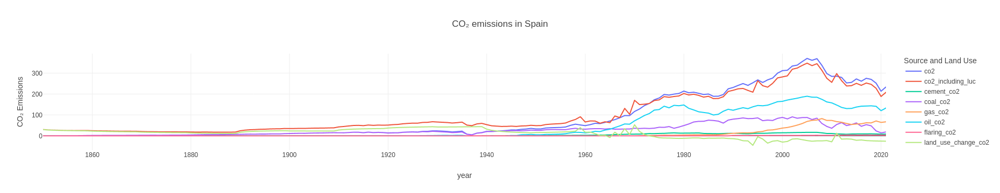

In [95]:
df_co2_ESP = df.loc[df['territory'] == 'Spain'][['year', 'cement_co2', 'co2', 'co2_including_luc', 
                                                         'coal_co2', 'flaring_co2', 
                                                         'gas_co2', 'oil_co2', 'land_use_change_co2']]

df_melted_co2_ESP = df_co2_ESP.melt(id_vars=['year'],
                                      value_vars=['co2', 'co2_including_luc', 'cement_co2', 'coal_co2', 'gas_co2', 'oil_co2', 'flaring_co2', 'land_use_change_co2'],
                                      var_name='Source and Land Use',
                                      value_name='CO₂ Emissions')

fig = px.line(df_melted_co2_ESP, 
              x="year", 
              y="CO₂ Emissions", 
              color='Source and Land Use',
              color_discrete_sequence=color_sequence,
              title='CO₂ emissions in Spain')
fig.show()

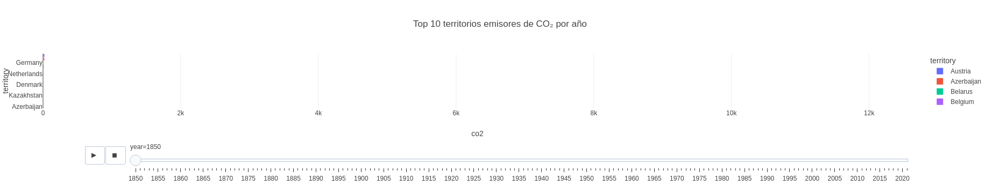

In [97]:
# Agrupar datos sin continentes desconocidos
df_map_2 = df.loc[df['continent'] != 'Unknown'].groupby(
    ["year", "territory"], as_index=False)["co2"].sum()

# Filtrar top 10 territorios por año para evitar gráficos sobrecargados
df_map_2['rank'] = df_map_2.groupby("year")['co2'].rank(method="first", ascending=False)
df_top10 = df_map_2[df_map_2['rank'] <= 15]

# Crear gráfico animado
fig = px.bar(df_top10, 
             x='co2', 
             y='territory', 
             color='territory',
             color_discrete_sequence=color_sequence,
             orientation='h',
             animation_frame='year',
             range_x=[0, df_top10['co2'].max() * 1.1],
             title='Top 10 territorios emisores de CO₂ por año')

# Ajustes de estilo
fig.update_layout(yaxis={'categoryorder':'total ascending'})
fig.show()

In [ ]:
# Streamlit ECO_Dashboard

# --- PAGE SETUP ---
st.set_page_config(page_title="CO2 Emissions Dashboard", layout="wide")

# --- COLORS ---
COLOR_PRIMARY = "#1c3e6d"
COLOR_ACCENT = "#f49828"
COLOR_GREEN = "#37a387"
COLOR_GREEN_LIGHT = "#71b85e"
COLOR_YELLOW = "#fad12f"
COLOR_BG = "#f5f8fa"

# --- CUSTOM STYLE ---
st.markdown(f"""
    <style>
        .main {{
            background-color: {COLOR_BG};
            color: {COLOR_PRIMARY};
        }}
        .sidebar .sidebar-content {{
            background-color: {COLOR_PRIMARY};
            color: {COLOR_PRIMARY};
        }}
        .css-1d391kg {{
            color: {COLOR_PRIMARY};
        }}
        h2, h1, h3, .stMarkdown p, .stText, .stTitle {{
            color: {COLOR_PRIMARY};
        }}
        .block-container {{
            padding-top: 2rem;
            padding-bottom: 0rem;
            padding-left: 2rem;
            padding-right: 2rem;
        }}
        .element-container {{
            margin-bottom: 0.5rem !important;
        }}
        iframe {{
            height: 300px !important;
        }}
    </style>
""", unsafe_allow_html=True)

# --- SIDE MENU ---
#logo in optional menu: st.sidebar.image("rebooteco_logo.png", width=140)
st.sidebar.title("CO2 Emissions Dashboard")
page = st.sidebar.radio("Content", [
    "Global Trend",
    "Events and Impacts",
    "CO₂-Temperature Relationship",
    "Emissions by Region",
    "Responsible Sectors"
])

# --- Load data ---
@st.cache_data
def load_data():
    return pd.read_csv("co2_emissions_with_coordinates.csv")

df = load_data()

# --- GLOBAL YEAR SLIDER ---
st.sidebar.markdown("---")
selected_year = st.sidebar.slider("Select year", min_value=1850, max_value=2025, value=2020)

# --- LOGO PER PAGE ---
st.image("rebooteco_logo.png", width=200)

# --- TITLES PER PAGE AND GRAPHICS ---
if page == "Global Trend":
    st.title("How has the global trend in CO₂ emissions evolved?")
    df_world = df[df['country'] == 'World']
    df_world_filtered = df_world[df_world['year'] <= selected_year]

    df_world_co2 = df_world_filtered[['year', 'cement_co2', 'co2', 'co2_including_luc', 'coal_co2', 'flaring_co2', 'gas_co2', 'oil_co2', 'land_use_change_co2']]
    df_melted = df_world_co2.melt(id_vars=['year'], var_name='Segmento', value_name='Emisiones de CO₂(MtCO₂)')

    col1, col2 = st.columns(2)
    with col1:
        st.subheader("Line by emission source")
        fig1 = px.line(df_melted, x="year", y="Emisiones de CO₂(MtCO₂)", color='Segmento', title='Emisiones globales por fuente')
        st.plotly_chart(fig1, use_container_width=True)

    with col2:
        st.subheader("Comparison: Total vs Including LUC")
        fig2 = px.area(df_world_filtered, x='year', y=['co2', 'co2_including_luc'], title='CO₂ total vs con cambio de uso de tierra')
        st.plotly_chart(fig2, use_container_width=True)

    col3, col4 = st.columns(2)
    with col3:
        st.subheader("Bar Chart by Sector for Selected Year")
        df_year = df_world_filtered[df_world_filtered['year'] == selected_year]
        df_bar = df_year[['cement_co2', 'coal_co2', 'flaring_co2', 'gas_co2', 'oil_co2', 'land_use_change_co2']].sum().reset_index()
        df_bar.columns = ['Sector', 'Emissions']
        fig3 = px.bar(df_bar, x='Sector', y='Emissions', title=f'Emissions by Sector in {selected_year}')
        st.plotly_chart(fig3, use_container_width=True)

    with col4:
        st.subheader("Cumulative Emissions")
        df_world_filtered['cumulative'] = df_world_filtered['co2'].cumsum()
        fig4 = px.line(df_world_filtered, x='year', y='cumulative', title='Historical Cumulative CO₂ Emissions')
        st.plotly_chart(fig4, use_container_width=True)

elif page == "Events and Impacts":
        st.title("What periods show significant changes and what events influenced them?")
        df = df[df['year'] <= selected_year]
        # Create decade column and calculate aggregates
        df["decade"] = (df["year"] // 10) * 10
        df_decade = df.groupby("decade")[["co2"]].sum().reset_index()
        df_decade["co2_growth_prct"] = df_decade["co2"].pct_change() * 100

        # Key events aligned with actual peaks
        updated_events = {
        1860: "First Industrial Revolution",
        1910: "World War I",
        1940: "World War II",
        1970: "Oil Crisis",
        1990: "Fall of the USSR",
        2020: "COVID-19"
        }

        # Create interactive figure with secondary Y-axis
        import plotly.graph_objects as go

        fig = go.Figure()

        # Emissions line (primary Y-axis)
        fig.add_trace(go.Scatter(
        x=df_decade["decade"],
        y=df_decade["co2"],
        mode="lines+markers",
        name="CO₂ Emissions",
        line=dict(color=COLOR_PRIMARY, width=3),
        yaxis="y"
        ))

        # Growth percentage line (secondary Y-axis)
        fig.add_trace(go.Scatter(
        x=df_decade["decade"],
        y=df_decade["co2_growth_prct"],
        mode="lines+markers",
        name="% Growth",
        line=dict(color=COLOR_ACCENT, width=2, dash="dash"),
        yaxis="y2"
        ))

        # Annotations
        for year, label in updated_events.items():
            if year in df_decade["decade"].values:
                y_val = df_decade[df_decade["decade"] == year]["co2"].values[0]
                fig.add_annotation(
                x=year,
                y=y_val,
                text=label,
                showarrow=True,
                arrowhead=1,
                ax=20,
                ay=-40,
                font=dict(size=10),
                arrowcolor="gray"
                )

        # Layout with two Y-axes
        fig.update_layout(
        title="Evolution of CO₂ Emissions and Key Events by Decade",
        xaxis_title="Decade",
        yaxis=dict(
            title="Emissions (Mt)",
            titlefont=dict(color=COLOR_PRIMARY),
            tickfont=dict(color=COLOR_PRIMARY)
        ),
        yaxis2=dict(
            title="% Growth",
            overlaying="y",
            side="right",
            showgrid=False,
            titlefont=dict(color=COLOR_ACCENT),
            tickfont=dict(color=COLOR_ACCENT)
        ),
        template="plotly_white",
        font=dict(color=COLOR_PRIMARY),
        legend=dict(orientation="h", y=-0.2)
        )

        # Display first row
        st.subheader("Emissions by Decade with Historical Events")
        st.plotly_chart(fig, use_container_width=True)

        # Second row: historical cumulative
        st.subheader("Historical Cumulative Emissions up to the Selected Year")
        df_world = df[df['country'] == 'World']
        df_world_filtered = df_world[df_world['year'] <= selected_year]
        df_world_filtered['cumulative'] = df_world_filtered['co2'].cumsum()
        fig2 = px.area(df_world_filtered, x='year', y='cumulative',
               title='Cumulative CO₂ Over Time',
               color_discrete_sequence=[COLOR_PRIMARY])
        st.plotly_chart(fig2, use_container_width=True)


elif page == "CO₂-Temperature Relationship":
    st.title("Is there a relationship between CO₂ emissions and temperature increase?")
    df_world = df[df['country'] == 'World']
    df = df[df['year'] <= selected_year]
    col1, col2 = st.columns(2)
    with col1:
        st.subheader("Temperature Change by Gas")
        df_world_temp = df_world[['year', 'temperature_change_from_ch4', 'temperature_change_from_co2', 'temperature_change_from_ghg', 'temperature_change_from_n2o']]
        df_temp_melted = df_world_temp.melt(id_vars=['year'], var_name='gas_type', value_name='temperature_change')
        fig1 = px.line(df_temp_melted, x="year", y="temperature_change", color='gas_type', title='Temperature Change by Gas')
        st.plotly_chart(fig1, use_container_width=True)

    with col2:
        st.subheader("Total CO₂ Emissions")
        fig2 = px.area(df_world, x='year', y='co2', title='Global CO₂ Emissions')
        st.plotly_chart(fig2, use_container_width=True)

    col3, col4 = st.columns(2)
    with col3:
        st.subheader("CO₂ vs Temperature Comparison")
        df_compare = df_world[['year', 'co2', 'temperature_change_from_ghg']].dropna()
        fig3 = px.line(df_compare, x='year', y=['co2', 'temperature_change_from_ghg'], title='CO₂ and Temperature Relationship')
        st.plotly_chart(fig3, use_container_width=True)

    with col4:
        st.subheader("CO₂ vs Temperature Scatter")
        fig4 = px.scatter(df_compare, x='co2', y='temperature_change_from_ghg', trendline='ols', title='CO₂ vs Temperature')
        st.plotly_chart(fig4, use_container_width=True)


elif page == "CO₂-Temperature Relationship":
    st.title("Is there a relationship between CO₂ emissions and temperature increase?")
    df_world = df[df['country'] == 'World']
     #---filter by year---
    df = df[df['year'] <= selected_year]

    col1, col2 = st.columns(2)
    with col1:
        st.subheader("Temperature Change by Gas")
        df_world_temp = df_world[['year', 'temperature_change_from_ch4', 'temperature_change_from_co2', 'temperature_change_from_ghg', 'temperature_change_from_n2o']]
        df_temp_melted = df_world_temp.melt(id_vars=['year'], var_name='gas_type', value_name='temperature_change')
        fig1 = px.line(df_temp_melted, x="year", y="temperature_change", color='gas_type', title='Temperature Change by Gas')
        st.plotly_chart(fig1, use_container_width=True)

    with col2:
        st.subheader("Total CO₂ Emissions")
        fig2 = px.area(df_world, x='year', y='co2', title='Global CO₂ Emissions')
        st.plotly_chart(fig2, use_container_width=True)

    col3, col4 = st.columns(2)
    with col3:
        st.subheader("CO₂ vs Temperature Comparison")
        df_compare = df_world[['year', 'co2', 'temperature_change_from_ghg']].dropna()
        fig3 = px.line(df_compare, x='year', y=['co2', 'temperature_change_from_ghg'], title='CO₂ and Temperature Relationship')
        st.plotly_chart(fig3, use_container_width=True)

    with col4:
        st.subheader("CO₂ vs Temperature Scatter")
        fig4 = px.scatter(df_compare, x='co2', y='temperature_change_from_ghg', trendline='ols', title='CO₂ vs Temperature')
        st.plotly_chart(fig4, use_container_width=True)

elif page == "Emissions by Region":
    st.title("Which continents are the biggest emitters?")
    df = pd.read_csv('dataset_visualizacion_co2.csv')

    # Primera fila: gráfica de barras ocupa toda la fila
    st.subheader("CO₂ Emissions by Continent Over Decades")
    df = df[df['year'] <= selected_year]
    df_continent = df[df['continent'] != 'Unknown'].groupby(["decade", "continent"], as_index=False)["co2_including_luc"].sum()
    fig1 = px.bar(df_continent,
                  x="decade",
                  y="co2_including_luc",
                  color="continent",
                  title="CO₂ Emissions by Continent Over Decades",
                  color_discrete_sequence=px.colors.qualitative.Set2)
    st.plotly_chart(fig1, use_container_width=True)

    # Segunda fila: dos columnas
    col1, col2 = st.columns(2)

    with col1:
        st.subheader("CO₂ Emissions by Country and Continent (Animated Map)")
        df_map = df[df['continent'] != 'Unknown'].groupby(["year", "continent", "iso_code", "territory"], as_index=False)["co2_including_luc"].sum()
        fig2 = px.scatter_geo(df_map,
                              locations="iso_code",
                              color="continent",
                              hover_name="territory",
                              size=(df_map["co2_including_luc"].abs())*2,
                              animation_frame="year",
                              projection="natural earth",
                              title="CO₂ Emissions by Country Over Time")
        st.plotly_chart(fig2, use_container_width=True)

    with col2:
        st.subheader("CO₂ Emissions Distribution in the 2010s")
        df_countries = df[(df['continent'] != 'Unknown') & (df['decade'] == 2010)] \
            .groupby(["continent", "iso_code", "territory"], as_index=False)["co2_including_luc"].sum()
        df_countries = df_countries[df_countries["co2_including_luc"] > 0]
        fig3 = px.sunburst(df_countries,
                           path=['continent', 'territory'],
                           values="co2_including_luc",
                           color='co2_including_luc',
                           hover_data=['iso_code'],
                           color_continuous_scale='RdBu',
                           title="CO₂ Emissions by Continent and Country (2010s)")
        st.plotly_chart(fig3, use_container_width=True)
    # Tercera fila: Global Share of CO₂ Emissions: China vs USA
    st.subheader("Global Share of CO₂ Emissions: China vs USA")
    df_chn_usa = df[df['territory'].isin(['China', 'United States'])][
            ['year', 'territory', 'share_global_co2_including_luc']]
    fig3 = px.line(df_chn_usa,
                       x="year",
                       y="share_global_co2_including_luc",
                       color='territory',
                       title="Country's Share of Global CO₂ Emissions")
    st.plotly_chart(fig3, use_container_width=True)

elif page == "Responsible Sectors":
    st.title("Which sectors are responsible for most CO₂ emissions?")
    df = pd.read_csv('dataset_visualizacion_co2.csv')
    df = df[df['year'] <= selected_year]
    # --- ROW 1 ---
    col1, col2 = st.columns(2)

    with col1:
        st.subheader("CO₂ Emissions per GDP in the 2010s")
        df_gdp = df[(df['continent'] != 'Unknown') & (df['decade'] == 2010)] \
            .groupby(["continent", "iso_code", "territory"], as_index=False)["co2_including_luc_per_gdp"].sum()

        # Escalar los valores pequeños
        df_gdp["co2_including_luc_per_gdp"] = df_gdp["co2_including_luc_per_gdp"] * 1_000_000

        # Filtrar valores positivos y redondear
        df_gdp = df_gdp[df_gdp["co2_including_luc_per_gdp"] > 1]
        df_gdp["co2_including_luc_per_gdp"] = df_gdp["co2_including_luc_per_gdp"].round(0)

        df_gdp = df_gdp[df_gdp["co2_including_luc_per_gdp"].abs() > 1e-6]

        if df_gdp.empty:
            st.warning("No CO₂ per GDP data available for this period.")
        else:
            fig2 = px.sunburst(
                df_gdp,
                path=['continent', 'territory'],
                values="co2_including_luc_per_gdp",
                color='co2_including_luc_per_gdp',
                hover_data=['iso_code'],
                color_continuous_scale='RdBu',
                title="CO₂ Emissions per GDP (2010s)"
            )
            st.plotly_chart(fig2, use_container_width=True)

    with col2:
        st.subheader("Global Share of CO₂ Emissions: DRC vs Liberia")
        df_cod_lbr = df[df['territory'].isin(['Democratic Republic of Congo', 'Liberia'])][
            ['year', 'territory', 'share_global_co2_including_luc']]
        fig1 = px.line(df_cod_lbr,
                    x="year",
                    y="share_global_co2_including_luc",
                    color='territory',
                    title="Country's Share of Global CO₂ Emissions")
        st.plotly_chart(fig1, use_container_width=True)

    # --- ROW 2 ---
    st.subheader("CO₂ Emissions in the DRC by Source")
    df_cod = df[df['territory'] == 'Democratic Republic of Congo'][[
            'year', 'cement_co2', 'co2', 'co2_including_luc',
            'coal_co2', 'flaring_co2', 'gas_co2', 'oil_co2', 'land_use_change_co2']]
    df_melted_cod = df_cod.melt(id_vars='year',
                                    var_name='Source',
                                    value_name='CO₂ Emissions')
    fig4 = px.line(df_melted_cod,
                    x="year",
                    y="CO₂ Emissions",
                    color='Source',
                    title='DRC: CO₂ Emissions by Source')
    st.plotly_chart(fig4, use_container_width=True)

    # --- ROW 3 ---
    col5, col6 = st.columns(2)

    with col5:
        st.subheader("CO₂ Emissions in China by Source")
        df_chn = df[df['territory'] == 'China'][[
            'year', 'cement_co2', 'co2', 'co2_including_luc',
            'coal_co2', 'flaring_co2', 'gas_co2', 'oil_co2', 'land_use_change_co2']]
        df_melted_chn = df_chn.melt(id_vars='year',
                                    var_name='Source',
                                    value_name='CO₂ Emissions')
        fig5 = px.line(df_melted_chn,
                       x="year",
                       y="CO₂ Emissions",
                       color='Source',
                       title='China: CO₂ Emissions by Source')
        st.plotly_chart(fig5, use_container_width=True)

    with col6:
        st.subheader("CO₂ Emissions in the USA by Source")
        df_usa = df[df['territory'] == 'United States'][[
            'year', 'cement_co2', 'co2', 'co2_including_luc',
            'coal_co2', 'flaring_co2', 'gas_co2', 'oil_co2', 'land_use_change_co2']]
        df_melted_usa = df_usa.melt(id_vars='year',
                                    var_name='Source',
                                    value_name='CO₂ Emissions')
        fig6 = px.line(df_melted_usa,
                       x="year",
                       y="CO₂ Emissions",
                       color='Source',
                       title='USA: CO₂ Emissions by Source')
        st.plotly_chart(fig6, use_container_width=True)


st.markdown("---")
